# Multi-Object Instance Segmentation using Detectron2

## Initialization

In [ ]:
# Install required libraries
!pip install -q torch_snippets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.6/79.6 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 10.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.2/204.2 kB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 37.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 85.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.6/30.6 MB 51.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 64.7 MB/s eta

In [ ]:
# Install tools for creating images in COCO format
!pip install -qU openimages
!pip install pyyaml pycocotools scikit-image
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 100.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 10.3 MB/s eta 0:00:00
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-58jl_p4o
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-58jl_p4o
  Resolved https://github.com/facebookresearch/detectron2.git to commit cc9266c2396d5545315e3601027ba4bc28e8c95b
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 77.3 MB/s eta 0:00:00
     ━━━━━━━

In [ ]:
# Import libraries
import os
from os import listdir
from os.path import isfile, join
import datetime
import json
from itertools import groupby
import zipfile
import shutil

import numpy as np
import pandas as pd
from PIL import Image
from openimages.download import _download_images_by_id

import torch
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from skimage.measure import find_contours, approximate_polygon, regionprops
from pycocotools import mask as maskUtils
from torch_snippets import *

!nvidia-smi # check if GPU is available
%matplotlib inline

Thu Mar 14 19:13:16 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8               9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Running on:", device)

Running on: cuda

In [ ]:
# Download required annotations and classes files
!wget -O train-annotations-object-segmentation.csv -q https://storage.googleapis.com/openimages/v5/train-annotations-object-segmentation.csv
!wget -O classes.csv -q https://raw.githubusercontent.com/openimages/dataset/master/dict.csv

In [ ]:
# Set the required classes and get the information about them from the csv file
required_classes = [
    'person',
    'dog',
    'bird',
    'car',
    'elephant',
    'football',
    'jug',
    'laptop',
    'mushroom',
    'pizza',
    'rocket',
    'shirt',
    'traffic sign',
    'watermelon',
    'zebra'
]

classes = pd.read_csv('classes.csv', header=None)
classes.columns = ['class','class_name']
classes = classes[classes['class_name'].map(lambda x: x in required_classes)]
classes

,class,class_name
43,/m/01226z,football
224,/m/015p6,bird
601,/m/01c648,laptop
753,/m/01g317,person
1022,/m/01mqdt,traffic sign
1045,/m/01n4qj,shirt
2819,/m/02vx4,football
4675,/m/052sf,mushroom
5181,/m/0663v,pizza
5916,/m/0898b,zebra


In [ ]:
# Get the images list and their annotations
annotations_df = pd.read_csv('train-annotations-object-segmentation.csv')

# Merge the classes with the annotations
annotations_data = pd.merge(annotations_df, classes, left_on='LabelName', right_on='class')

# Get a subset of 500 images and their masks
subset_data = annotations_data.groupby('class_name').agg({'ImageID': lambda x: list(x)[:500]})
image_ids_to_keep = {item for sublist in subset_data['ImageID'] for item in sublist}
subset_data = annotations_data[annotations_data['ImageID'].isin(image_ids_to_keep)]
print(subset_data.head(1).to_dict())

# Get the subset images' masks
subset_masks = subset_data['MaskPath'].tolist()

{
    'MaskPath': {0: 'e9a7da5ff1fd56df_m01g317_1803811b.png'},
    'ImageID': {0: 'e9a7da5ff1fd56df'},
    'LabelName': {0: '/m/01g317'},
    'BoxID': {0: '1803811b'},
    'BoxXMin': {0: 0.468125},
    'BoxXMax': {0: 0.62875},
    'BoxYMin': {0: 0.188714},
    'BoxYMax': {0: 0.949121},
    'PredictedIoU': {0: 0.86841},
    'Clicks': {
        0: '0.47513 0.38255 1;0.52118 0.91333 0;0.47513 0.91333 1;0.49188 0.27516 0;0.48079 0.85580 0;0.55239 
0.93092 1;0.56507 0.27765 0;0.50163 0.28301 0;0.48901 0.88944 1;0.53411 0.21865 1;0.49127 0.37217 1'
    },
    'class': {0: '/m/01g317'},
    'class_name': {0: 'person'}
}

In [ ]:
# # Download the necessary masks, unzip and move them to the masks folder
os.makedirs('masks', exist_ok=True)
for c in Tqdm('0123456789abcdef'):
    !wget -q https://storage.googleapis.com/openimages/v5/train-masks/train-masks-{c}.zip
    !unzip -q train-masks-{c}.zip -d tmp_masks
    !rm train-masks-{c}.zip
    tmp_masks = Glob('tmp_masks', silent=True)
    masks = [(mask, fname(mask)) for mask in tmp_masks]
    masks = [(i, j) for (i, j) in masks if j in subset_masks]
    for i, j in masks:
        os.rename(i, f'masks/{j}')
    !rm -rf tmp_masks

100%|██████████| 16/16 [34:05<00:00, 127.86s/it]


In [ ]:
# Gather the masks file paths, get the image ids and download the images
masks = set(fname(mask) for mask in Glob('masks'))

subset_data = subset_data[subset_data['MaskPath'].map(lambda x: x in masks)]
subset_image_ids = subset_data['ImageID'].tolist()

!mkdir images
_download_images_by_id(subset_image_ids, 'train', './images/')

100%|██████████| 14090/14090 [13:16<00:00, 17.68it/s]


In [ ]:
# Save all the selected images and masks to a zip file
files = Glob('images') + Glob('masks') + ['train-annotations-object-segmentation.csv', 'classes.csv']
with zipfile.ZipFile('data.zip','w') as zip_file:
    for file in Tqdm(files):
        zip_file.write(file, compress_type=zipfile.ZIP_DEFLATED)

In [ ]:
# Move everything to the correct folder
!mkdir -p train/
!mv images train/images
!mv masks train/annotations

In [ ]:
# Create the JSON file structure for the COCO format
coco_json = {
    "info": {
        "description": "images",
        "url": "None",
        "version": "1.0",
        "year": 2024,
        "contributor": "keneth4",
        "date_created": datetime.datetime.utcnow().isoformat(' ')
    },
    "licenses": [
        {
            "id": 1,
            "name": "MIT"
        }
    ],
    "categories": [
        {
            'id': id + 1,
            'name': name.replace('/', ''),
            'supercategory': 'none'
        } for id, (_, (name, _)) in enumerate(classes.iterrows())
    ],
    "images": [],
    "annotations": []
}

In [ ]:
# Create a function to create image information
def create_image_info(
    image_id,
    file_name,
    image_size,
    date_captured=datetime.datetime.utcnow().isoformat(' '),
    license_id=1,
    coco_url="",
    flickr_url=""
):
    return {
        "id": image_id,
        "file_name": file_name,
        "width": image_size[0],
        "height": image_size[1],
        "date_captured": date_captured,
        "license": license_id,
        "coco_url": coco_url,
        "flickr_url": flickr_url,
    }

# Create a function to resize a binary mask
def resize_binary_mask(array, new_size):
    image = Image.fromarray(array.astype(np.uint8)*255)
    image = image.resize(new_size)
    return np.asarray(image).astype(np.bool_)

# Create a function to close a contour
def close_contour(contour):
    if not np.array_equal(contour[0], contour[-1]):
        contour = np.vstack((contour, contour[0]))
    return contour

# Create a function to convert binary mask to RLE
def binary_mask_to_rle(binary_mask):
    rle = {'counts': [], 'size': list(binary_mask.shape)}
    counts = rle.get('counts')
    for i, (value, elements) in enumerate(groupby(binary_mask.ravel(order='F'))):
        if i == 0 and value == 1:
                counts.append(0)
        counts.append(len(list(elements)))
    return rle

# Create a function to convert binary mask to RLE
def create_annotation_info(annotation_id, image_id, category_info, binary_mask, image_size, tolerance=2):
    """Create annotation information in COCO format.
    Args:
        annotation_id (int): Unique id for this annotation.
        image_id (int): Id of the image this annotation belongs to.
        category_info (dict): Dictionary containing category id and is_crowd flag.
        binary_mask (np.ndarray): A binary mask of the object.
        image_size (tuple): The size of the image.
        tolerance (int): Tolerance for polygon approximation.
    Returns:
        dict: Annotation information dictionary.
    """
    # Resize mask if necessary
    if binary_mask.shape != image_size:
        binary_mask = resize_binary_mask(binary_mask, image_size)

    # Encode mask to RLE
    binary_mask_encoded = maskUtils.encode(np.asfortranarray(binary_mask.astype(np.uint8)))
    area = maskUtils.area(binary_mask_encoded)
    bounding_box = maskUtils.toBbox(binary_mask_encoded).tolist()

    if category_info["is_crowd"]:
        segmentation = binary_mask_to_rle(binary_mask)
    else:
        # Pad binary mask
        padded_binary_mask = np.pad(binary_mask, pad_width=1, mode='constant', constant_values=0)
        contours = find_contours(padded_binary_mask, 0.5)
        segmentation = []
        for contour in contours:
            # Subtract 1 from each contour individually here
            contour = contour - 1  # Correct adjustment
            contour = close_contour(contour)
            # Approximate contour if necessary
            if tolerance > 0:
                contour = approximate_polygon(contour, tolerance)
            if len(contour) < 3:
                continue
            contour = np.flip(contour, axis=1)
            segmentation.append(contour.ravel().tolist())

    return {
        "id": annotation_id,
        "image_id": image_id,
        "category_id": category_info["id"],
        "iscrowd": category_info.get("is_crowd", 0),
        "area": area.item() if isinstance(area, np.ndarray) else area,  # Ensure area is a scalar
        "bbox": bounding_box,
        "segmentation": segmentation,
        "width": binary_mask.shape[1],
        "height": binary_mask.shape[0],
    }

In [ ]:
# Retrieve the lists of images and annotations
root_dir = "train"
image_dir, annotation_dir = 'train/images/', 'train/annotations/'
image_files = [file for file in listdir(image_dir) if isfile(join(image_dir, file))]
annotation_files = [file for file in listdir(annotation_dir) if isfile(join(annotation_dir, file))]

# Populate the JSON file with the images information
for image_id, image_filename in enumerate(image_files):
    image = Image.open(f'{image_dir}/{image_filename}')
    image_info = create_image_info(image_id, os.path.basename(image_filename), image.size)
    coco_json["images"].append(image_info)

# Populate the JSON file with the annotations information
annotation_id = 1
for annotation_filename in Tqdm(annotation_files):
    image_id = [image for image in coco_json['images'] if stem(image['file_name'])==annotation_filename.split('_')[0]][0]['id']
    class_id = [category['id'] for category in coco_json['categories'] if category['name'] in annotation_filename][0]
    category_info = {'id': class_id, 'is_crowd': 'crowd' in annotation_filename}
    binary_mask = np.asarray(Image.open(f'{annotation_dir}/{annotation_filename}').convert('1')).astype(np.uint8)
    annotation_info = create_annotation_info(annotation_id, image_id, category_info, binary_mask, image.size, tolerance=2)
    if annotation_info is not None:
        coco_json["annotations"].append(annotation_info)
        annotation_id += 1

# Update the JSON file with the correct number of annotations
coco_json['categories'] = [
    {
        'id': id + 1,
        'name': clss_name,
        'supercategory': 'none'
    } for id, (_, (_, clss_name)) in enumerate(classes.iterrows())
]

100%|██████████| 14090/14090 [15:50<00:00, 14.82it/s]


In [ ]:
# Create a custom encoder for numpy data types to be able to save the JSON file
class NumpyEncoder(json.JSONEncoder):
    """Custom encoder for numpy data types"""
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        elif isinstance(obj, datetime.datetime):
            return obj.isoformat(' ')
        return super(NumpyEncoder, self).default(obj)

# Save the JSON file
with open('images.json', 'w') as output_json_file:
    json.dump(coco_json, output_json_file, cls=NumpyEncoder)

# Register the dataset
register_coco_instances("dataset_train", {}, "images.json", "train/images")

In [ ]:
# Load a pre-trained model configuration file and set necessary parameters for training
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025 # Learning rate
cfg.SOLVER.MAX_ITER = 5000 # Maximum number of iterations (batches)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)

In [ ]:
# Train the model
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/14 19:37:42 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:00, 219MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[03/14 19:37:44 d2.engine.train_loop]: Starting training from iteration 0
[03/14 19:38:01 d2.utils.events]:  eta: 0:43:08  iter: 19  total_loss: 3.67  loss_cls: 2.744  loss_box_reg: 0.1503  loss_mask: 0.6927  loss_rpn_cls: 0.05882  loss_rpn_loc: 0.02262    time: 0.5264  last_time: 0.5205  data_time: 0.0320  last_data_time: 0.0210   lr: 4.9953e-06  max_mem: 2564M
[03/14 19:38:17 d2.utils.events]:  eta: 0:43:01  iter: 39  total_loss: 3.582  loss_cls: 2.64  loss_box_reg: 0.1642  loss_mask: 0.693  loss_rpn_cls: 0.03568  loss_rpn_loc: 0.01377    time: 0.5292  last_time: 0.5016  data_time: 0.0218  last_data_time: 0.0126   lr: 9.9902e-06  max_mem: 2564M
[03/14 19:38:27 d2.utils.events]:  eta: 0:42:44  iter: 59  total_loss: 3.27  loss_cls: 2.375  loss_box_reg: 0.1205  loss_mask: 0.6922  loss_rpn_cls: 0.04059  loss_rpn_loc: 0.01159    time: 0.5141  last_time: 0.4956  data_time: 0.0134  last_data_time: 0.0090   lr: 1.4985e-05  max_mem: 2564M
[03/14 19:38:38 d2.utils.events]:  eta: 0:42:39  iter:

In [ ]:
# Save the model
shutil.copy('output/model_final.pth', 'output/trained_model.pth')

'output/trained_model.pth'

[03/14 20:36:45 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/trained_model.pth ...


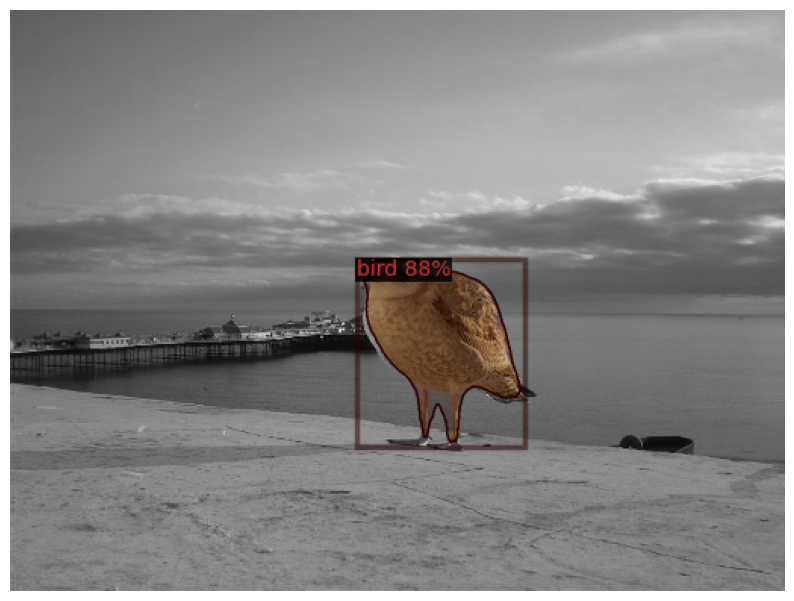

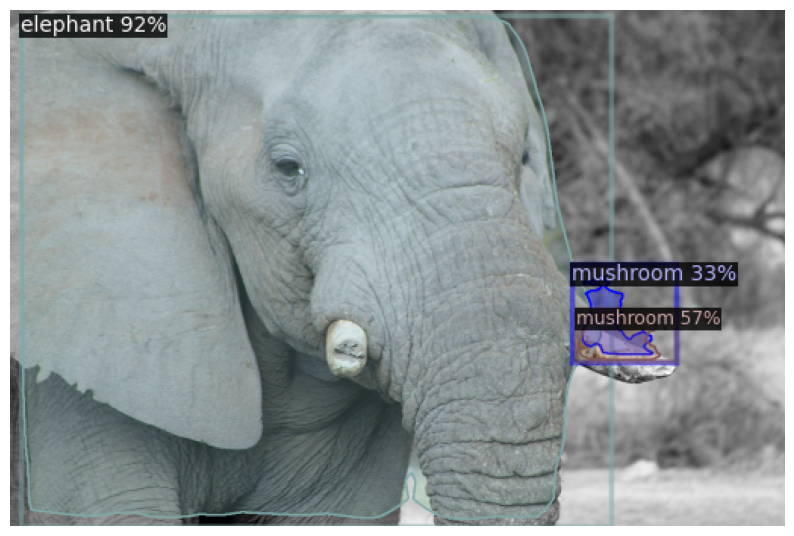

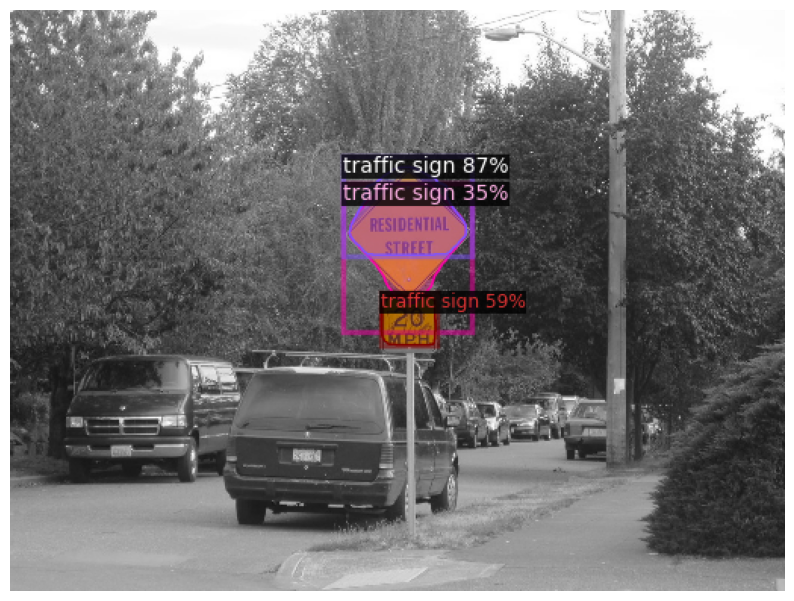

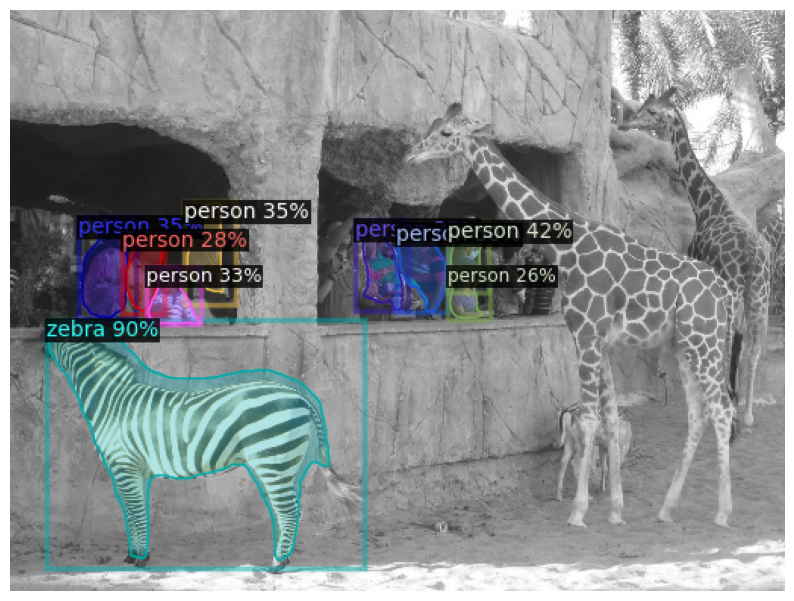

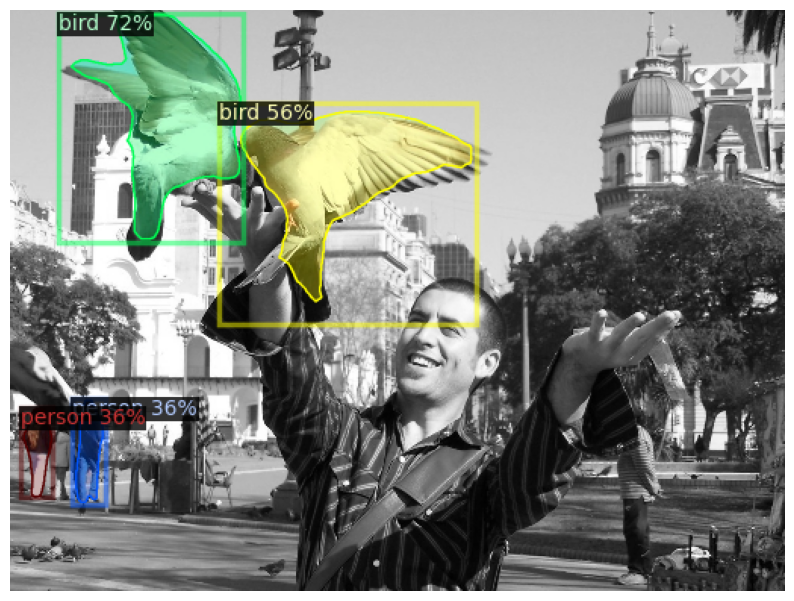

...

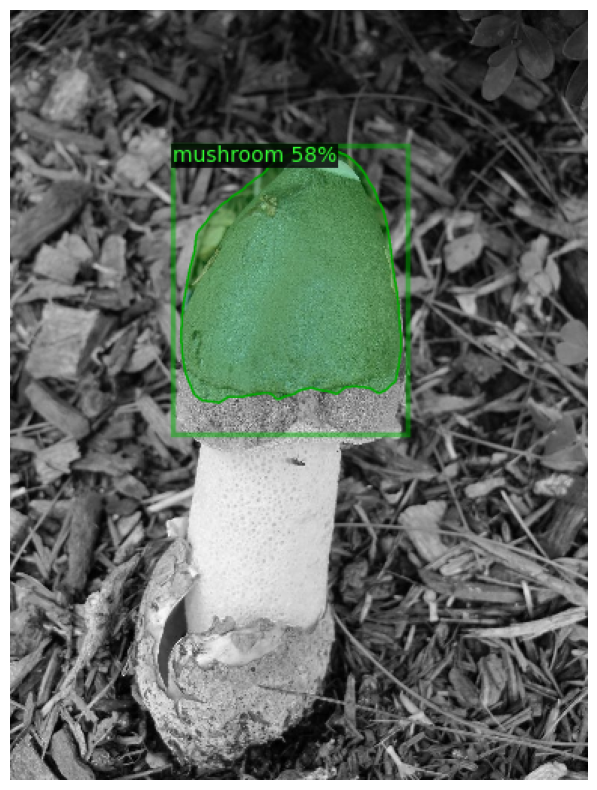

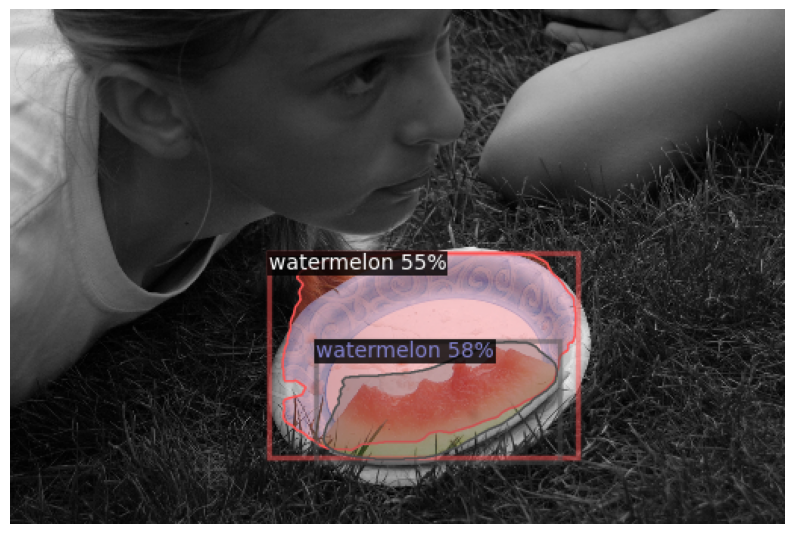

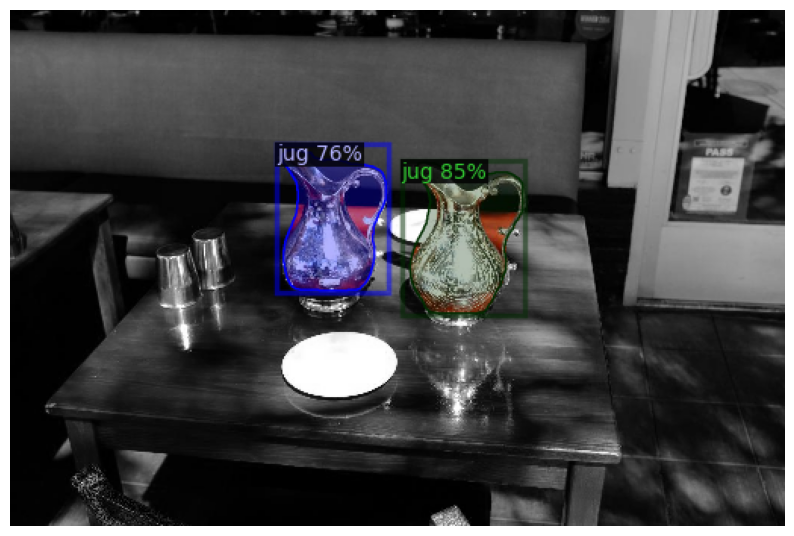

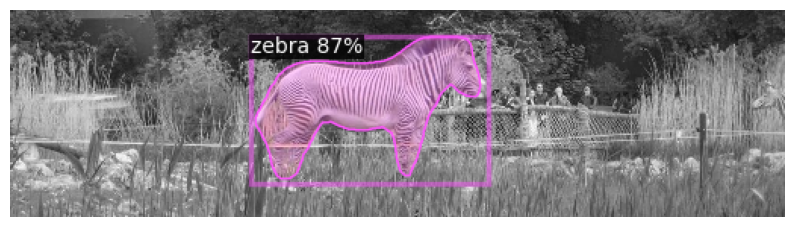

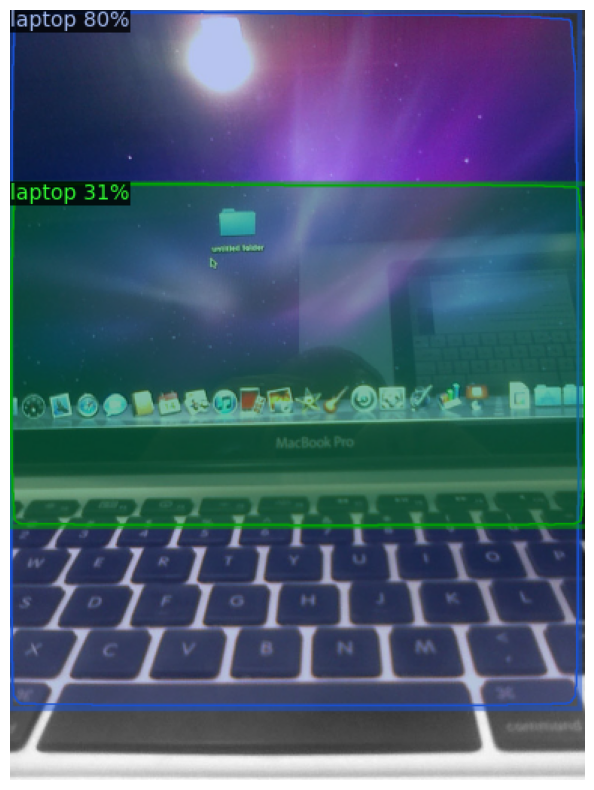

In [ ]:
# Make predictions using the trained model and visualize the results
# Load the saved model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "trained_model.pth")

# Set the testing threshold for this model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25

# Create a predictor
predictor = DefaultPredictor(cfg)

files = Glob('train/images')
for file_path in files[:30]:
    image = Image.open(file_path).convert("RGB")

    image_np = np.array(image)
    image_np = image_np[:, :, ::-1]  # Convert RGB to BGR

    outputs = predictor(image_np)  # Make prediction

    visualizer = Visualizer(
        image_np,
        metadata=MetadataCatalog.get(cfg.DATASETS.TRAIN[0]),
        scale=0.5,
        instance_mode=ColorMode.IMAGE_BW  # Remove the colors of unsegmented pixels
    )
    vis_image = visualizer.draw_instance_predictions(outputs["instances"].to("cpu")).get_image()

    show(vis_image[:, :, ::-1])  # Convert BGR back to RGB for visualization